# Data Preparation, EDA, and Initial Models

#### Imports

In [211]:
# Basic imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
import warnings

# Custom imports 
import utils
import linreg_utils

# Stylesheet
plt.style.use('./styles.txt')
warnings.filterwarnings('ignore')

#### Index

1. [Introduction](#intro)<br>
2. [Data Loading and Cleaning](#dl)<br>
3. [Creating Additional Features](#features)<br>
    3.1 [Saving the DataFrame](#saving)<br>
4. [Preprocessing](#pp)<br>
    4.1 [Preprocessing Categorical Data](#pp_cat)<br>
    4.2 [Preprocessing Numerical Data](#pp_num)<br>
5. [Exploring the Relationships Between Variables](#relationships)<br>
6. [Baseline Linear Regression](#base_linreg)<br>
    6.1 [Preparation](#prep)<br>
    6.2 [Model Building](#model_building)<br>
    6.3 [Baseline Model Evaluation](#evaluation)<br>
    6.4 [Model Improvement](#improvement)<br>
7. [Baseline Logistic Regression](#base_logreg)<br>


---
<a id='intro'></a>
# Introduction

In previous notebooks, the data that we had access to was very limited; although we had wildfire data, we only had a handful of features. Since then, we have been able to buildl upon our, adding important information such as weather data and emissions data. In this notebook, then, we will continue the EDA process that was previously omitted. Additionally, we will derive further features from the weather data that we have collected, namely the variance and the change observed in that feature from the a week prior to the day of the wildfire (we will refer to this as delta). 

Following on from our EDA process, we can begin to build some baseline models to see how our features are performing for linear and logistic regression models.

---
<a id='dl'></a>
## Data Loading and Cleaning

Prior to any analysis, we need to load the data from the `.pkl` file that we created in a previous notebook.

In [5]:
# Load data
df_raw = pd.read_pickle('sample_data/30k_wildfires_weather_emissions.pkl')

In [6]:
# # Check output of the DataFrame
df_raw.drop('index', axis=1, inplace=True)
df_raw.head(2)

,DATE,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,STATE,tempmax,avg_tempmax,...,avg_dew,windspeed,avg_windspeed,winddir,avg_winddir,pressure,avg_pressure,ch4,co2,n2o
0,1992-01-01,1992,1,0.1,A,43.3250,-101.018500,SD,"[6.7, 6.7, 1.7, 7.2, 8.4, 1.7, 4.4]",5.257143,...,-6.071429,"[13.0, 22.3, 31.7, 20.5, 11.2, 18.7, 11.2]",18.371429,"[295.9, 179.8, 186.4, 218.7, 263.2, 173.2, 247.3]",223.5,"[1026.9, 1029.2, 1017.7, 1012.2, 1019.1, 1024....",1021.671429,4.613353e-11,3.672947e-09,3.926278e-12
1,1992-01-01,1992,1,3.0,B,33.0634,-90.120813,MS,"[16.7, 13.4, 10.7, 11.7, 12.2, 10.7, 15.7]",13.014286,...,3.771429,"[14.8, 18.4, 14.8, 14.8, 18.4, 22.3, 11.2]",16.385714,"[25.9, 46.9, 303.3, 10.4, 29.3, 36.9, 70.2]",74.7,"[1023.4, 1023.0, 1019.5, 1020.8, 1024.5, 1027....",1023.442857,1.679468e-11,3.891437e-09,1.957145e-12


We can get a general overview of the DataFrame with the following function, although it should be noted that as we have columns that contain lists, we will be unable to see the number of duplicate rows:

In [7]:
utils.BasicEda(df_raw, 'Extended Wildfire Data', ['shape', 'null', 'columns', 'dtypes'])

EXTENDED WILDFIRE DATA
----------------------

Rows: 30000    Columns: 27

Total null rows: 0
Percentage null rows:  0.000%

DATE               datetime64[ns]
FIRE_YEAR                   int64
DISCOVERY_DOY               int64
FIRE_SIZE                 float64
FIRE_SIZE_CLASS            object
LATITUDE                  float64
LONGITUDE                 float64
STATE                      object
tempmax                    object
avg_tempmax               float64
temp                       object
avg_temp                  float64
humidity                   object
avg_humidity              float64
precip                     object
avg_precip                float64
dew                        object
avg_dew                   float64
windspeed                  object
avg_windspeed             float64
winddir                    object
avg_winddir               float64
pressure                   object
avg_pressure              float64
ch4                       float64
co2                      

Given the number of observations, the number of non-null rows is not currently being shown. From the API call, we know that rows that contain lists will have no null values, although there may be null values within the list itself. From that, we also know that if no weather data was available for a given latitude and longitude combination for the entire week leading to the wildfire, the aggregate calculation that we have already created will be a null value. With this in mind, let us take a look at the null values present in the DataFrame.

In [8]:
df_raw.isna().sum()

DATE                  0
FIRE_YEAR             0
DISCOVERY_DOY         0
FIRE_SIZE             0
FIRE_SIZE_CLASS       0
LATITUDE              0
LONGITUDE             0
STATE                 0
tempmax               0
avg_tempmax           2
temp                  0
avg_temp            947
humidity              0
avg_humidity       1004
precip                0
avg_precip         4354
dew                   0
avg_dew            1004
windspeed             0
avg_windspeed       940
winddir               0
avg_winddir        4144
pressure              0
avg_pressure       3594
ch4                   0
co2                   0
n2o                   0
dtype: int64

There are a number of ways in which we can handle null values. The optimum solution would be to try and find alternate sources that may provide weather information where the Visual Crossing API was unable to. Alternatively, we can impute null values with some other constant or calculated value, however given the nature of weather data, using a constant would cause skew within the data set. Calculating an approximate value may similarly affect the distributions of the data set. Finally, we have the option to remove observations that have null values present. Let us calculate the number of observations this latter option would remove.

In [9]:
# Create columns to search
cumulative_cols = ['tempmax', 'temp', 'humidity', 'precip', 'dew', 'winddir', 'pressure']

# Instantiate set of row indexes that have null values
indexes = set()

# Iterate through each row
for index, row in df_raw.iterrows():
    # Iterate through the relevant columns
    for col in cumulative_cols:
        # See whether column has null value
        if True in np.isnan(row[col]):
            indexes.add(index)
            break
            
print(f'The total number of rows with null values is: {len(indexes):,}')

The total number of rows with null values is: 9,149


Unfortunately, we see that we will be removing approximately 29% of our data. Although this is a big loss, we have created a large sample to allow for such occurances.

In [10]:
# Drop these indexes from our data
df_raw.drop(index=indexes, inplace=True)

In [11]:
df_raw.isna().sum()

DATE               0
FIRE_YEAR          0
DISCOVERY_DOY      0
FIRE_SIZE          0
FIRE_SIZE_CLASS    0
LATITUDE           0
LONGITUDE          0
STATE              0
tempmax            0
avg_tempmax        0
temp               0
avg_temp           0
humidity           0
avg_humidity       0
precip             0
avg_precip         0
dew                0
avg_dew            0
windspeed          0
avg_windspeed      0
winddir            0
avg_winddir        0
pressure           0
avg_pressure       0
ch4                0
co2                0
n2o                0
dtype: int64

In [12]:
# Check new shape of DataFrame
df_raw.shape

(20851, 27)

In [13]:
# Create a copy of the DataFrame
df_cleaned = df_raw.copy()

---
<a id='features'></a>
## Creating Additional Features

While it would have been entirely possible to calculate the variance and delta during the collection of the weather data, we included the list of historic weather data in case we wanted to calculate further features at later stages of our project, without having to go through the tedious process of collecting the weather data through the API.

One of the variables that we are able to create is the variance for each of the weather features. The reasoning for calculating such a metric is to see how the weather fluctuated in the days leading to the wildfire. Large variances could be indicative of spiking temperatures, wind, and pressure. Variance alone, however, is not indicative of whether a change in weather was positive or negative. It is for that reason that we calculate the delta, which will act as a heuristic for this. 

In [14]:
week_data = [
    'tempmax',
    'temp',
    'humidity',
    'precip',
    'dew',
    'windspeed',
    'winddir',
    'pressure'
]

In [15]:
for metric in week_data:
    variance_col_name = f'{metric}_variance'
    df_cleaned[variance_col_name] = df_cleaned[metric].apply(lambda x: np.var(x))
    
    delta_col_name = f'{metric}_delta'
    df_cleaned[delta_col_name] = df_cleaned[metric].apply(lambda x: x[-1] - x[0])

In [16]:
df_cleaned.head()

,DATE,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,STATE,tempmax,avg_tempmax,...,precip_variance,precip_delta,dew_variance,dew_delta,windspeed_variance,windspeed_delta,winddir_variance,winddir_delta,pressure_variance,pressure_delta
0,1992-01-01,1992,1,0.10,A,43.325000,-101.018500,SD,"[6.7, 6.7, 1.7, 7.2, 8.4, 1.7, 4.4]",5.257143,...,0.000000,0.00,5.399184,3.5,47.062041,-1.8,1889.074286,-48.6,28.913469,-4.3
2,1992-01-01,1992,1,1.00,B,33.058333,-79.979167,SC,"[10.8, 11.2, 16.0, 15.9, 13.9, 12.6, 15.5]",13.700000,...,55.589796,-4.40,7.196327,0.1,5.575510,2.0,15648.559592,-14.9,19.071020,2.4
3,1992-01-02,1992,2,0.25,A,40.775000,-74.854160,NJ,"[7.8, 8.0, 7.5, 6.4, 2.3, 5.0, 7.7]",6.385714,...,9.546510,0.00,19.731020,4.0,34.516735,-10.6,16492.948163,-254.6,75.711429,-0.9
5,1992-01-03,1992,3,1.91,B,31.018500,-83.297300,GA,"[15.1, 15.6, 9.8, 16.0, 13.2, 16.7, 14.8]",14.457143,...,59.321224,-9.70,9.142041,-4.1,11.228571,0.2,16679.204898,223.6,21.585306,-8.4
6,1992-01-03,1992,3,2.00,B,30.728900,-87.238100,FL,"[16.9, 12.6, 11.6, 14.9, 14.7, 15.9, 14.4]",14.428571,...,0.213355,-1.32,10.262857,-7.9,27.382857,6.7,19587.093469,-24.8,13.107755,-2.7


In [17]:
# Sanity check to make sure that we have no null values in the data set
df_cleaned.isna().sum()

DATE                  0
FIRE_YEAR             0
DISCOVERY_DOY         0
FIRE_SIZE             0
FIRE_SIZE_CLASS       0
LATITUDE              0
LONGITUDE             0
STATE                 0
tempmax               0
avg_tempmax           0
temp                  0
avg_temp              0
humidity              0
avg_humidity          0
precip                0
avg_precip            0
dew                   0
avg_dew               0
windspeed             0
avg_windspeed         0
winddir               0
avg_winddir           0
pressure              0
avg_pressure          0
ch4                   0
co2                   0
n2o                   0
tempmax_variance      0
tempmax_delta         0
temp_variance         0
temp_delta            0
humidity_variance     0
humidity_delta        0
precip_variance       0
precip_delta          0
dew_variance          0
dew_delta             0
windspeed_variance    0
windspeed_delta       0
winddir_variance      0
winddir_delta         0
pressure_varianc

In [18]:
# Check duplicate values
df_cleaned.drop(week_data, axis=1).duplicated().sum()

0

In [19]:
df_cleaned.drop(week_data, axis=1, inplace=True)

In [20]:
df_cleaned.reset_index(drop=True, inplace=True)

<a id='saving'></a>
#### Saving the DataFrame

In [21]:
# df_cleaned.to_pickle('sample_data/30k_engineered.pkl')

---
<a id='pp'></a>
## Preprocessing

Now that we have cleaned the data and created additional features, we can prepare the data for the linear and logistic models that we hope to build. To start this process, we will separate the DataFrame into *numeric* and *categorical* columns, working on these individually and eventually combining the two.

In [22]:
numeric_df = df_cleaned.select_dtypes('number').copy()
categorical_df = df_cleaned.select_dtypes('object').copy()

In [23]:
print("Numeric columns: \n", ',\n '.join(numeric_df.columns))
print("")
print("Categorical columns: \n", ', \n '.join(categorical_df.columns))

Numeric columns: 
 FIRE_YEAR,
 DISCOVERY_DOY,
 FIRE_SIZE,
 LATITUDE,
 LONGITUDE,
 avg_tempmax,
 avg_temp,
 avg_humidity,
 avg_precip,
 avg_dew,
 avg_windspeed,
 avg_winddir,
 avg_pressure,
 ch4,
 co2,
 n2o,
 tempmax_variance,
 tempmax_delta,
 temp_variance,
 temp_delta,
 humidity_variance,
 humidity_delta,
 precip_variance,
 precip_delta,
 dew_variance,
 dew_delta,
 windspeed_variance,
 windspeed_delta,
 winddir_variance,
 winddir_delta,
 pressure_variance,
 pressure_delta

Categorical columns: 
 FIRE_SIZE_CLASS, 
 STATE


In [24]:
numeric_df.head()

,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,LATITUDE,LONGITUDE,avg_tempmax,avg_temp,avg_humidity,avg_precip,avg_dew,...,precip_variance,precip_delta,dew_variance,dew_delta,windspeed_variance,windspeed_delta,winddir_variance,winddir_delta,pressure_variance,pressure_delta
0,1992,1,0.10,43.325000,-101.018500,5.257143,-2.928571,81.142857,0.000000,-6.071429,...,0.000000,0.00,5.399184,3.5,47.062041,-1.8,1889.074286,-48.6,28.913469,-4.3
1,1992,1,1.00,33.058333,-79.979167,13.700000,9.885714,81.428571,4.185714,6.671429,...,55.589796,-4.40,7.196327,0.1,5.575510,2.0,15648.559592,-14.9,19.071020,2.4
2,1992,2,0.25,40.775000,-74.854160,6.385714,1.585714,67.185714,1.394286,-4.242857,...,9.546510,0.00,19.731020,4.0,34.516735,-10.6,16492.948163,-254.6,75.711429,-0.9
3,1992,3,1.91,31.018500,-83.297300,14.457143,11.828571,78.957143,4.685714,8.128571,...,59.321224,-9.70,9.142041,-4.1,11.228571,0.2,16679.204898,223.6,21.585306,-8.4
4,1992,3,2.00,30.728900,-87.238100,14.428571,10.985714,79.971429,0.188571,7.500000,...,0.213355,-1.32,10.262857,-7.9,27.382857,6.7,19587.093469,-24.8,13.107755,-2.7


In [25]:
categorical_df.head()

,FIRE_SIZE_CLASS,STATE
0,A,SD
1,B,SC
2,A,NJ
3,B,GA
4,B,FL


As there are far more categoricl columns, we will start by processing those.
<a id='pp_cat'></a>
### Preprocessing Categorical Data

This process is going to be simple considering we only have 2 categorical columns: `FIRE_SIZE_CLASS` and `STATE`. Our preprocessing will consist of binarising the `STATE` column. While we could numerically encode the `FIRE_SIZE_CLASS` column, this would be unnecessary as this will only be used as a target variable, rather than a predictor.

In [26]:
categorical_df.nunique().sort_values()

FIRE_SIZE_CLASS     7
STATE              52
dtype: int64

#### Processing `STATE`

Although the US is made of 50 states, the wildfire data includes the district of Columbia and Puerto Rico, which brings the total up to 52 states in total. While we could encode these numerically (assign each state with a value ranging from 1-52), such encoding would artificially inflate the importance of certain states. We will therefore create dummy variables for this column, binarising the `STATE` column.

In [27]:
# Create dummies DataFrame
state_dummies = pd.get_dummies(categorical_df['STATE'], prefix='state')
state_dummies.head()

,state_AK,state_AL,state_AR,state_AZ,state_CA,state_CO,state_CT,state_DC,state_DE,state_FL,...,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY
0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [28]:
categorical_df = pd.concat([categorical_df, state_dummies], axis=1)
categorical_df.head()

,FIRE_SIZE_CLASS,STATE,state_AK,state_AL,state_AR,state_AZ,state_CA,state_CO,state_CT,state_DC,...,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY
0,A,SD,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,B,SC,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,A,NJ,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,B,GA,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,B,FL,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [29]:
# Drop redundant column
categorical_df.drop('STATE', axis=1, inplace=True)

In [30]:
categorical_df.head(2)

,FIRE_SIZE_CLASS,state_AK,state_AL,state_AR,state_AZ,state_CA,state_CO,state_CT,state_DC,state_DE,...,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY
0,A,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,B,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<a id='pp_num'></a>
### Preprocessing Numerical Columns
We can continue our preprocessing by shifting our attention towards the numeric columns in our DataFrame.

In [31]:
numeric_df.head()

,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,LATITUDE,LONGITUDE,avg_tempmax,avg_temp,avg_humidity,avg_precip,avg_dew,...,precip_variance,precip_delta,dew_variance,dew_delta,windspeed_variance,windspeed_delta,winddir_variance,winddir_delta,pressure_variance,pressure_delta
0,1992,1,0.10,43.325000,-101.018500,5.257143,-2.928571,81.142857,0.000000,-6.071429,...,0.000000,0.00,5.399184,3.5,47.062041,-1.8,1889.074286,-48.6,28.913469,-4.3
1,1992,1,1.00,33.058333,-79.979167,13.700000,9.885714,81.428571,4.185714,6.671429,...,55.589796,-4.40,7.196327,0.1,5.575510,2.0,15648.559592,-14.9,19.071020,2.4
2,1992,2,0.25,40.775000,-74.854160,6.385714,1.585714,67.185714,1.394286,-4.242857,...,9.546510,0.00,19.731020,4.0,34.516735,-10.6,16492.948163,-254.6,75.711429,-0.9
3,1992,3,1.91,31.018500,-83.297300,14.457143,11.828571,78.957143,4.685714,8.128571,...,59.321224,-9.70,9.142041,-4.1,11.228571,0.2,16679.204898,223.6,21.585306,-8.4
4,1992,3,2.00,30.728900,-87.238100,14.428571,10.985714,79.971429,0.188571,7.500000,...,0.213355,-1.32,10.262857,-7.9,27.382857,6.7,19587.093469,-24.8,13.107755,-2.7


To better understand which features require transformation, we will plot histograms of the various features. One of the assumptions of linear regression models is that features are normally distributed. We will therefore try to normalise the features such that this assumption holds true in order to create a more accurate model.

In [32]:
utils.HistogramSubplots(numeric_df.drop('FIRE_SIZE', axis=1))

From the plots we are able to see that a few columns are somewhat normally distributed. These columns include the delta for the weather features. Variance columns are all skewed right, and other columns are so unevenly distributed that the plots provide little information. Perhaps we can better visualise those columns with a boxplot.

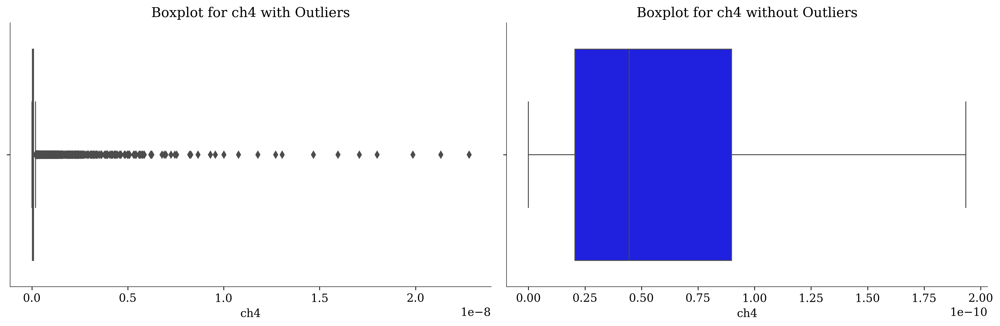

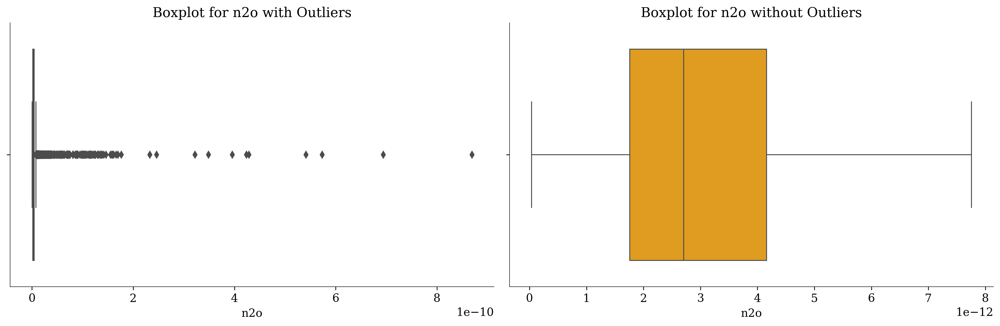

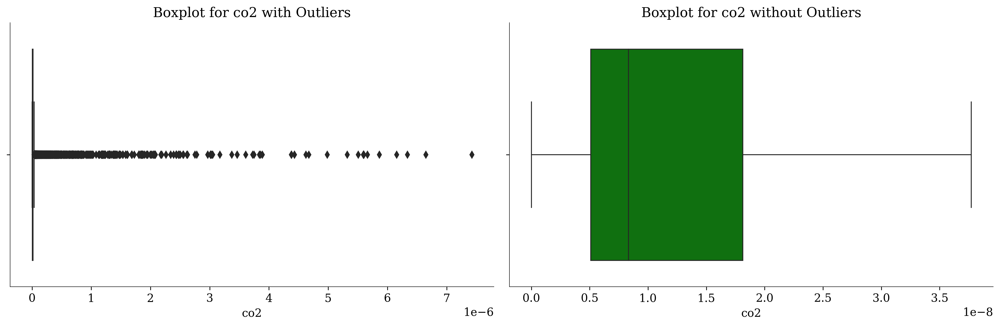

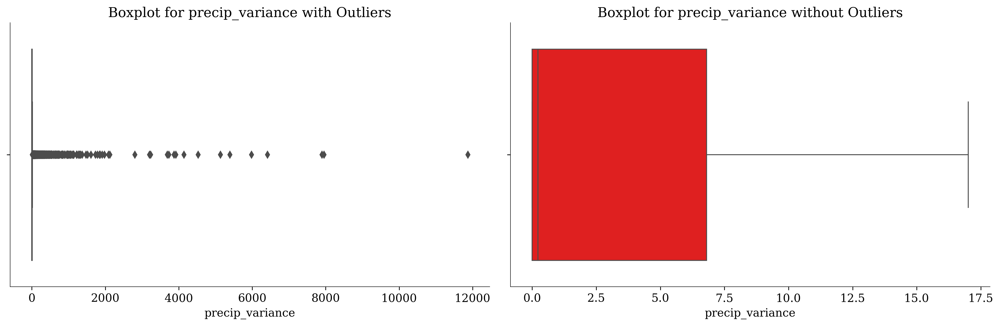

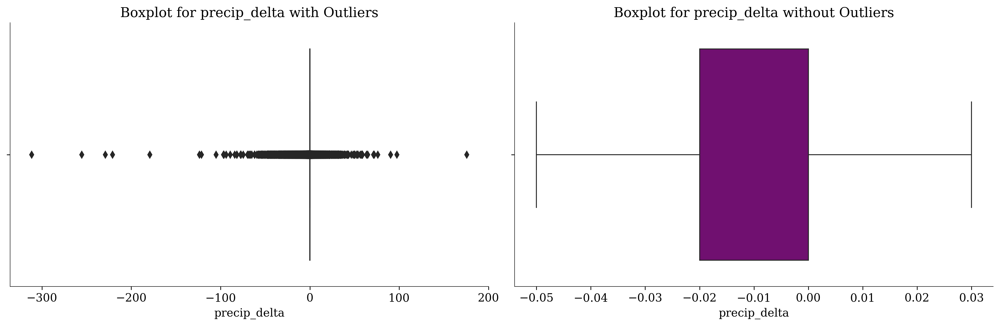

In [33]:
boxplot_cols = ['ch4', 'n2o', 'co2', 'precip_variance', 'precip_delta']

colours =  ['blue', 'orange', 'green', 'red', 'purple']

for col, colour in zip(boxplot_cols, colours):
    tmp = numeric_df[col]
    plt.subplots(1, 2, figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    sns.boxplot(x=tmp, color=colour)
    plt.title(f'Boxplot for {col} with Outliers')
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x=tmp, showfliers=False, color=colour)
    plt.title(f'Boxplot for {col} without Outliers')
    
    plt.show()

We see that these columns are vastly skewed, but how do they correlate with the other features in the DataFrame?

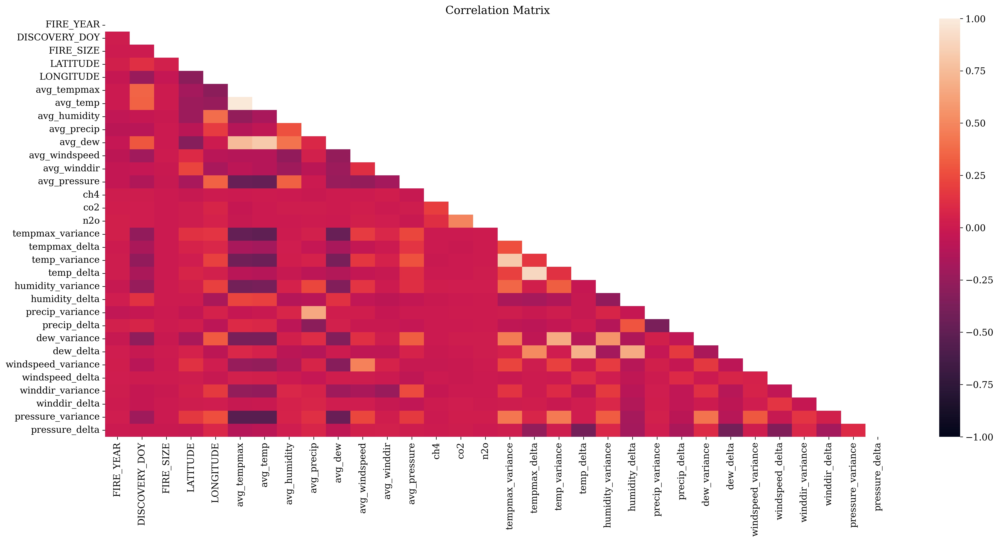

In [34]:
# Plot the correlation using a heatmap
corr = numeric_df.corr()

plt.figure(figsize=(20,10), dpi=300)
plt.title('Correlation Matrix')
matrix = np.triu(corr)
sns.heatmap(corr, mask=matrix, vmin=-1, vmax=1)
plt.show()

Our model hopes to predict the size of a fire; looking at the column for `FIRE_SIZE` we see that there is very little - in fact, almost no - correlation with other features. We see this better in the correlation martix below.

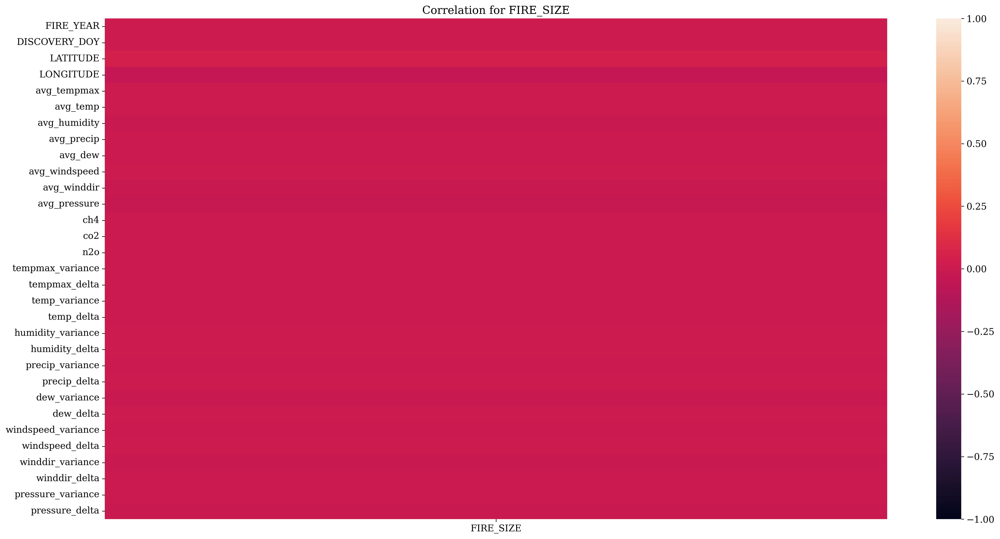

In [35]:
fire_size_corr = corr[['FIRE_SIZE']].drop('FIRE_SIZE', axis=0)

plt.figure(figsize=(20,10), dpi=300)
plt.title('Correlation for FIRE_SIZE')
sns.heatmap(fire_size_corr, vmin=-1, vmax=1)
plt.show()

---
<a id='relationships'></a>
## Exploring the Relationships Between Variables

On the basis of the previous exploration, can any features be used to predict others? To figure this out, it helps to begin by plotting variables against each other, to visualize the relationship between them.

In [36]:
X_input = numeric_df.drop('FIRE_SIZE', axis=1)
X_input.head()

,FIRE_YEAR,DISCOVERY_DOY,LATITUDE,LONGITUDE,avg_tempmax,avg_temp,avg_humidity,avg_precip,avg_dew,avg_windspeed,...,precip_variance,precip_delta,dew_variance,dew_delta,windspeed_variance,windspeed_delta,winddir_variance,winddir_delta,pressure_variance,pressure_delta
0,1992,1,43.325000,-101.018500,5.257143,-2.928571,81.142857,0.000000,-6.071429,18.371429,...,0.000000,0.00,5.399184,3.5,47.062041,-1.8,1889.074286,-48.6,28.913469,-4.3
1,1992,1,33.058333,-79.979167,13.700000,9.885714,81.428571,4.185714,6.671429,23.514286,...,55.589796,-4.40,7.196327,0.1,5.575510,2.0,15648.559592,-14.9,19.071020,2.4
2,1992,2,40.775000,-74.854160,6.385714,1.585714,67.185714,1.394286,-4.242857,18.157143,...,9.546510,0.00,19.731020,4.0,34.516735,-10.6,16492.948163,-254.6,75.711429,-0.9
3,1992,3,31.018500,-83.297300,14.457143,11.828571,78.957143,4.685714,8.128571,19.200000,...,59.321224,-9.70,9.142041,-4.1,11.228571,0.2,16679.204898,223.6,21.585306,-8.4
4,1992,3,30.728900,-87.238100,14.428571,10.985714,79.971429,0.188571,7.500000,17.000000,...,0.213355,-1.32,10.262857,-7.9,27.382857,6.7,19587.093469,-24.8,13.107755,-2.7


In [113]:
from math import ceil

columns = 4
rows = ceil(len(X_input.columns) / columns)

plt.subplots(rows, columns, figsize=(30,30), dpi=300)

for position, col in enumerate(X_input, start=1):
    plt.subplot(rows, columns, position)
    sns.histplot(x=X_input[col], 
                 y=df_cleaned['FIRE_SIZE_CLASS'],
                 kde=True)

plt.tight_layout()
plt.show()

Typically, plots like the one above are meant to indicate some sort of linear relation between predictor and feature. Unfortunately, we see that there are no features that indicate that such a relationship exists between `FIRE_SIZE_CLASS` (which we used as a proxy for `FIRE_SIZE`) and any of the features, which indicates that the models we will build may not be accurate.

---
<a id='base_linreg'></a>
## Baseline Linear Regression

In statistics, regression is a technique for modeling the relationship between a dependent variable (also known as an outcome or target variable) and one or more independent variables (also known as predictor variables). The dependent variable is the variable that is being predicted, while the independent variables are the variables that are used to predict the dependent variable.

There are many different types of regression models, but the most common type is linear regression. In linear regression, the dependent variable is predicted by a linear combination of the independent variables. That is, the dependent variable is a linear function of the independent variables.

The coefficients in a linear regression model represent the strength of the relationships between the independent variables and the dependent variable. The intercept is the constant term in the linear regression model and represents the predicted value of the dependent variable when all of the independent variables are set to zero.

The coefficients in a linear regression model can be interpreted in terms of the expected change in the dependent variable for a one-unit change in each of the independent variables. For example, if the coefficient for an independent variable is two, then we would expect the dependent variable to increase by two for a one-unit increase in the independent variable.

So far the analysis that we have been doing has been in preparation for building a linear regression model and although our findings have not indicated that a highly accurate model can be built, we will begin our model building process by creating a baseline linear regression.

<a id='prep'></a>
### Preparation

In order to build this model there are a few things that we have to do before hand. First, we need to format the data - this includes transformations on skewed data using Boxcox.

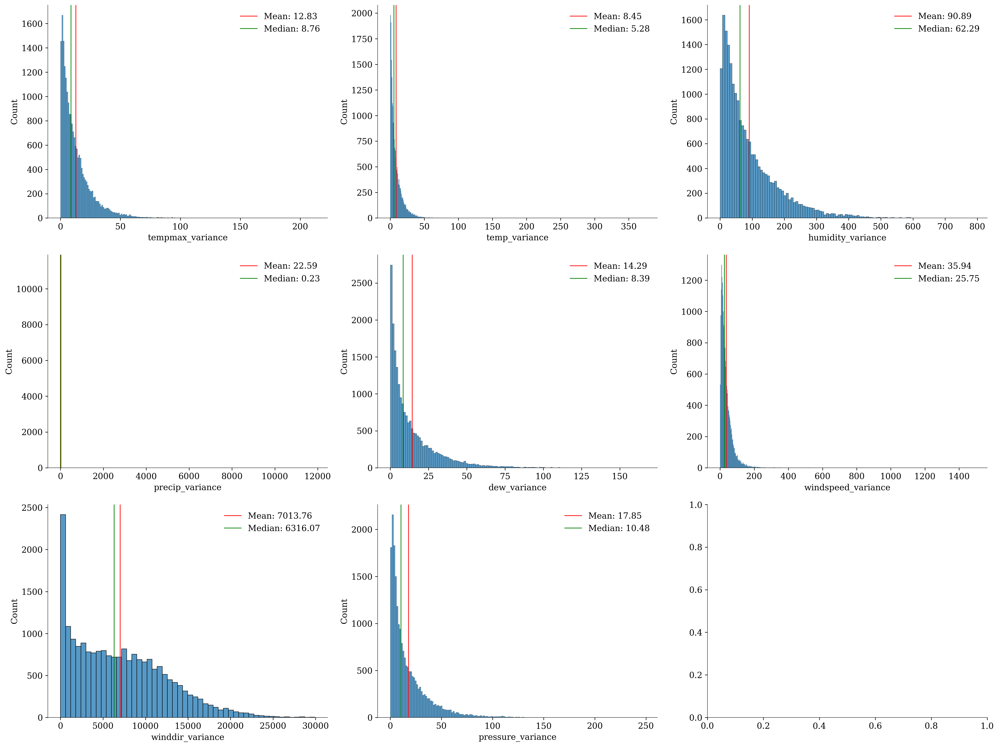

In [37]:
boxcox_cols = [col for col in numeric_df.columns
               if 'variance' in col]

utils.HistogramSubplots(numeric_df[boxcox_cols], figsize=(20, 15))

As we mentioned earlier, our linear regression model is based on the assumption that features are normally distributed. We see, however, that these are heavily right skewed, meaning they do not conform to our assumptions of a linear regression. We can transform these columns using a Box Cox transformation to see whether we are able to normalise their distribution. To do Box Cox, the variables need to be greater than 0. Let us look at the variables and see whether they fall within the range:

In [38]:
numeric_df[boxcox_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
tempmax_variance,20851.0,12.828399,13.465794,0.001224,3.499184,8.756327,17.403673,212.282449
temp_variance,20851.0,8.447304,9.943393,0.012653,1.989796,5.276327,11.563265,373.487755
humidity_variance,20851.0,90.893124,88.044584,0.187755,26.417959,62.291020,128.072857,791.417143
precip_variance,20851.0,22.594312,176.365582,0.000000,0.000000,0.225441,6.803071,11870.070612
dew_variance,20851.0,14.291504,16.451731,0.016735,2.851429,8.393469,19.834898,166.250612
windspeed_variance,20851.0,35.944840,37.009957,0.291020,12.849592,25.747755,47.240612,1490.442449
winddir_variance,20851.0,7013.763855,5415.470092,0.757143,2344.036327,6316.071020,10643.864694,29931.213469
pressure_variance,20851.0,17.848506,20.582998,0.033878,3.977551,10.481224,24.478776,248.764082


We see that the minimum value for precipitation is 0, meaning that we need to remove this from the transformations. Before we change it in the`processed_df`, we should see how the transformation works out.

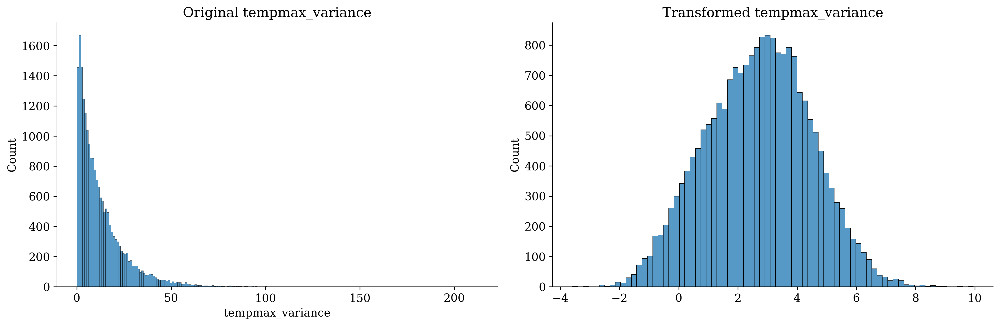

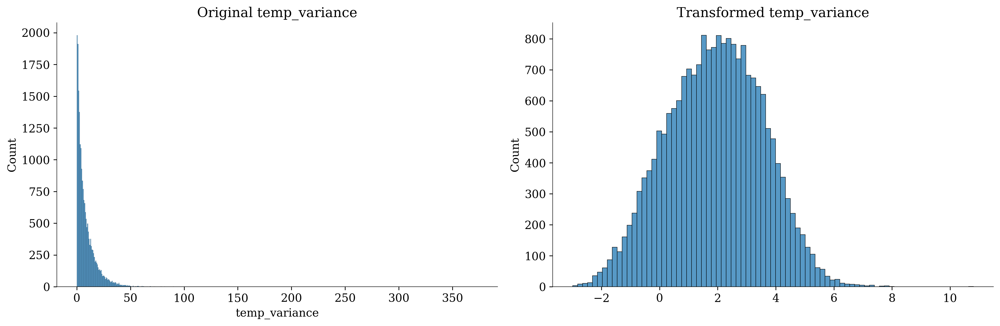

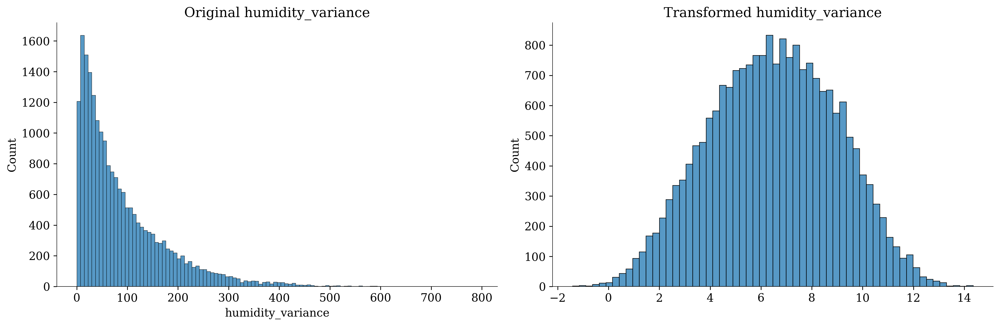

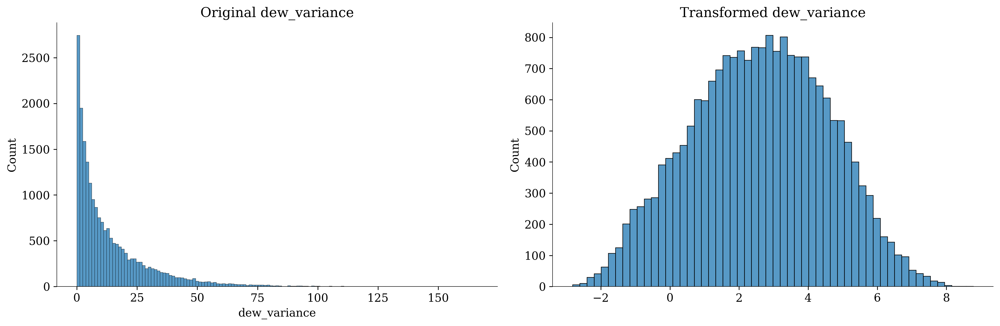

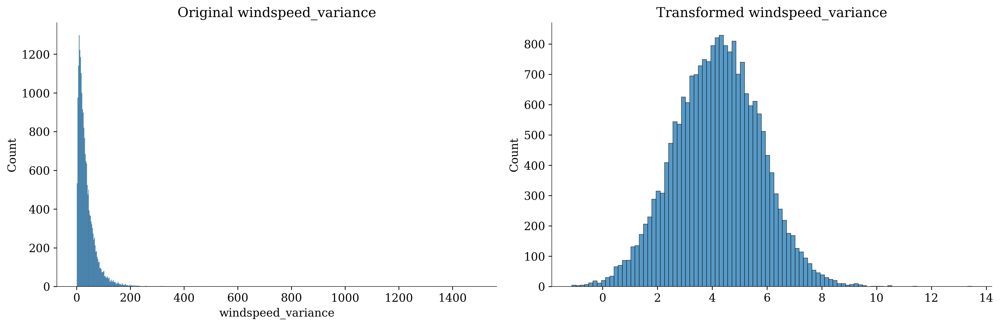

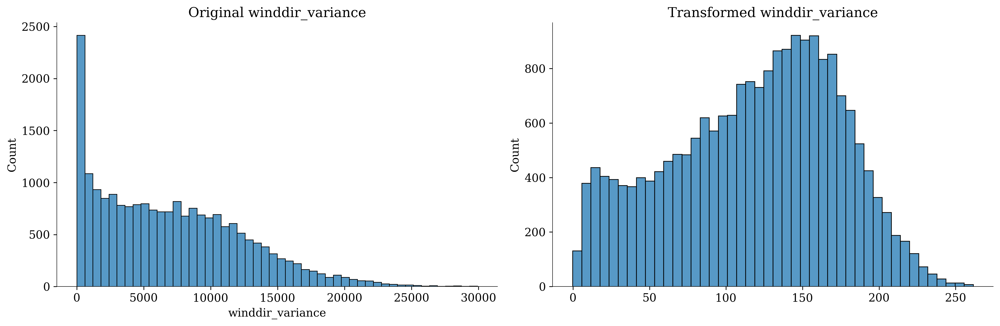

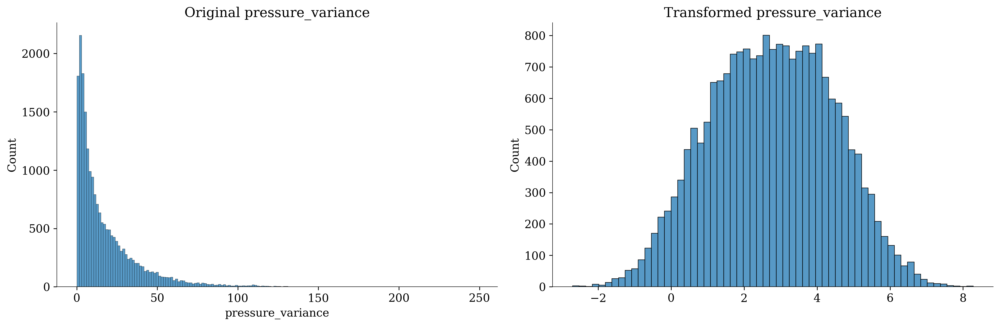

In [39]:
from scipy.stats import boxcox

boxcox_cols.remove('precip_variance')

tmp = numeric_df.copy()

for col in boxcox_cols:
    X = numeric_df[col]
    X = boxcox(X)[0]
    
    # Create subplots
    plt.subplots(1, 2, dpi=300, figsize=(15, 5))
    
    # Plot original
    plt.subplot(1, 2, 1)
    plt.title(f'Original {col}')
    sns.histplot(x=numeric_df[col])
    
    plt.subplot(1, 2, 2)
    plt.title(f'Transformed {col}')
    sns.histplot(x=X)

We see that the transformations has made these columns have a normal distribution which will improve the performance of the model. We can therefore change the values in the DataFrame.

In [40]:
for col in boxcox_cols:
    numeric_df[col] = boxcox(numeric_df[col])[0]

In [41]:
numeric_df.head()

,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,LATITUDE,LONGITUDE,avg_tempmax,avg_temp,avg_humidity,avg_precip,avg_dew,...,precip_variance,precip_delta,dew_variance,dew_delta,windspeed_variance,windspeed_delta,winddir_variance,winddir_delta,pressure_variance,pressure_delta
0,1992,1,0.10,43.325000,-101.018500,5.257143,-2.928571,81.142857,0.000000,-6.071429,...,0.000000,0.00,1.996879,3.5,5.249817,-1.8,70.421101,-48.6,4.284964,-4.3
1,1992,1,1.00,33.058333,-79.979167,13.700000,9.885714,81.428571,4.185714,6.671429,...,55.589796,-4.40,2.407602,0.1,1.966009,2.0,192.632581,-14.9,3.640714,2.4
2,1992,2,0.25,40.775000,-74.854160,6.385714,1.585714,67.185714,1.394286,-4.242857,...,9.546510,0.00,4.046228,4.0,4.703349,-10.6,197.472098,-254.6,5.925481,-0.9
3,1992,3,1.91,31.018500,-83.297300,14.457143,11.828571,78.957143,4.685714,8.128571,...,59.321224,-9.70,2.767724,-4.1,2.927803,0.2,198.521705,223.6,3.828579,-8.4
4,1992,3,2.00,30.728900,-87.238100,14.428571,10.985714,79.971429,0.188571,7.500000,...,0.213355,-1.32,2.947874,-7.9,4.311854,6.7,214.161435,-24.8,3.091151,-2.7


Having transformed these columns, perhaps we will see a change in the correlation between the predictor variables and the target.

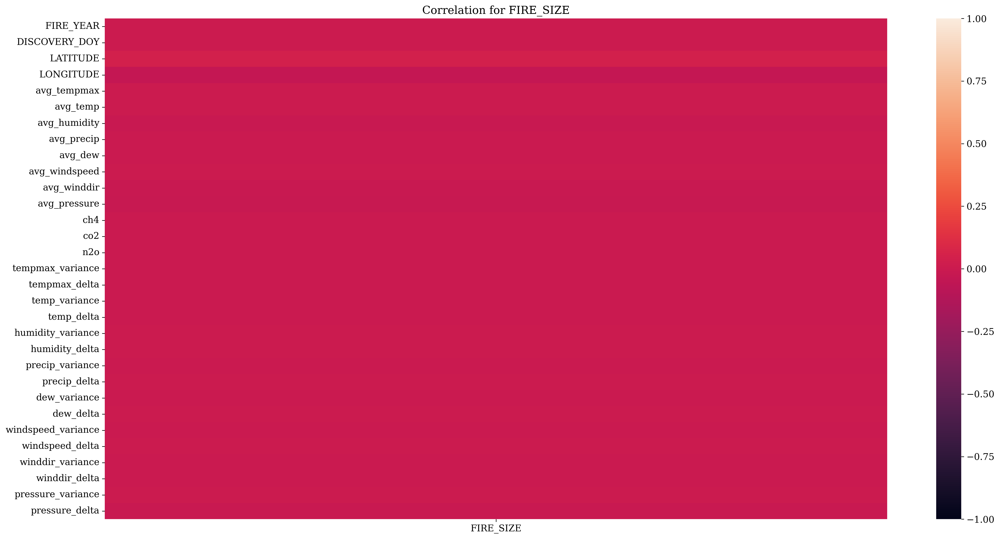

In [42]:
# Plot the correlation using a heatmap
corr = numeric_df.corr()
fire_size_corr = corr[['FIRE_SIZE']].drop('FIRE_SIZE', axis=0)

plt.figure(figsize=(20,10), dpi=300)
plt.title('Correlation for FIRE_SIZE')
sns.heatmap(fire_size_corr, vmin=-1, vmax=1)
plt.show()

Unfortunately, the transformation has not changed the correlation between these variables. We will now begin building a Linear Regression model, although we can predict that this will not yield positive results.

<a id='model_building'></a>
### Model Building

In [49]:
df_processed = pd.concat([numeric_df, categorical_df], axis=1)
df_processed.head()

,FIRE_YEAR,DISCOVERY_DOY,FIRE_SIZE,LATITUDE,LONGITUDE,avg_tempmax,avg_temp,avg_humidity,avg_precip,avg_dew,...,state_SD,state_TN,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY
0,1992,1,0.10,43.325000,-101.018500,5.257143,-2.928571,81.142857,0.000000,-6.071429,...,1,0,0,0,0,0,0,0,0,0
1,1992,1,1.00,33.058333,-79.979167,13.700000,9.885714,81.428571,4.185714,6.671429,...,0,0,0,0,0,0,0,0,0,0
2,1992,2,0.25,40.775000,-74.854160,6.385714,1.585714,67.185714,1.394286,-4.242857,...,0,0,0,0,0,0,0,0,0,0
3,1992,3,1.91,31.018500,-83.297300,14.457143,11.828571,78.957143,4.685714,8.128571,...,0,0,0,0,0,0,0,0,0,0
4,1992,3,2.00,30.728900,-87.238100,14.428571,10.985714,79.971429,0.188571,7.500000,...,0,0,0,0,0,0,0,0,0,0


<a id='model_goals'></a>
### Model Goals

Now that we have trasnformed and cleaned the data we are ready to check our assumptions for a linear regression model. In order to do this, we can distinguish our target and predictor variables.

In [198]:
X = df_processed.drop(['FIRE_SIZE', 'FIRE_SIZE_CLASS'], axis=1)
y = df_processed['FIRE_SIZE']

#### 1. Linearity

Previously we were able to see whether there were any linear relationships in the numeric variables. Now that we have processed the data and added the transformed categorical columns, we can plot scatter graphs of the variables against the `FIRE_SIZE` column, to see whether there are any linear relationships.

In [54]:
columns = 4
rows = ceil(len(X.columns) / columns)

plt.subplots(rows, columns, figsize=(30,30), dpi=300)

for position, col in enumerate(X, start=1):
    plt.subplot(rows, columns, position)
    sns.scatterplot(x=X[col], 
                 y=y)
    plt.title(col)

plt.tight_layout()
plt.show()

Unfortunately, we see that there are still no linear relationships between the independent and dependent variables. The next assumption of our linear model is independence.

#### 2. Independence

Independence hopes to show which features in the data are heavily correlated, which as a result contributes to multicollinearity. This can be easily identified when two variables are highly correlated. To see this, therefore, we will plot a correlation matrix of the variables.

/Users/ejb/Documents/Brainstation/Capstone-Project/utils.py:379: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr()


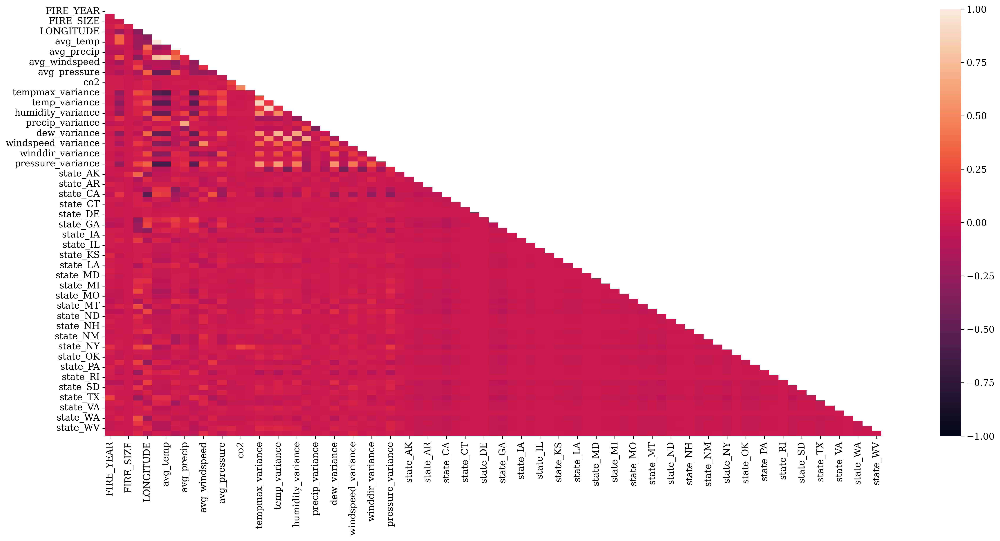

In [69]:
utils.PlotCorrelationMatrix(df_processed, annot=False)

Unfortunately, given the number of predictor variables, the correlation matrix above is unable to show any valuable information. That being said, we are able to make some inferences from the correlation matrix that we created previously. 

In our data set there is a lot of multicollinearity considering the fact that some of the variables are derived from the data itself. This is to say that there will be a correlation between the various metrics that we calculated for the various weather metrics. Additionally, there will be correlation between different weather metrics themselves considering the way in which they will interact. 

Although we were unable to show the correlation using the confusion matrix above, we are able to use VIF to evaluate the multicollinearity between different variables.

#### Calculating VIF


Variance inflation factor (VIF) is a measure of the amount of multicollinearity in a set of predictor variables. It is calculated by taking the reciprocal of the variance of a linear regression coefficient estimated using the entire predictor set. A VIF of 1 indicates that there is no multicollinearity among the predictor variables. A VIF greater than 1 indicates that there is multicollinearity among the predictor variables.

In [202]:
from statsmodels.regression import linear_model 
import statsmodels.api as sm

# Add constant 
X_with_constant = sm.add_constant(X)

In [203]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# check VIF values for linear regression model
vif_df = pd.DataFrame(
    {'VIF': [variance_inflation_factor(X_with_constant.values, i) for i in range(X_with_constant.shape[1])]}, 
    index=X_with_constant.columns
).sort_values(by='VIF')

Having calculated the VIF for the variables, we are able to see how high the multicollinearity is. Let us begin by looking at those variables that have the lowest VIF.

In [204]:
vif_df.head()

,VIF
const,0.000000
ch4,1.068322
winddir_delta,1.101186
FIRE_YEAR,1.200540
windspeed_delta,1.263007


We see that these variables have a VIF that is only marginally greater than 1. Let us see how high the VIF is for the tail of the DataFrame.

In [205]:
vif_df.tail()

,VIF
state_MD,inf
state_ME,inf
state_MI,inf
state_MO,inf
state_WY,inf


We see then that there are a number of variables that have an infinite VIF, which indicates that the corresponding variable may be expressed exactly by a linear combination of other variables. Let us see which of our variables has a VIF of infinity.

In [206]:
vif_df[vif_df['VIF'] == np.inf]

,VIF
state_NC,inf
state_ND,inf
state_OK,inf
state_NE,inf
state_NH,inf
state_NJ,inf
state_NM,inf
state_NV,inf
state_NY,inf
state_OH,inf


In [207]:
len(vif_df[vif_df['VIF'] == np.inf])

52

We see that all the states can be perfectly explained by a linear combination of other variables - why might this be the case? A dummy variable trap is when you include a dummy variable in your regression model and then also include a term in the model that is a function of that dummy variable. This results in perfect multicollinearity and causes issues with the model. In our case, we can observe the following linear relationship:

$$state_1 + state_2 + ... + state_{52} = 1$$


This results in perfect multicollinearity between the state variables. This directly impacts the linear regression analysis because linear regression assumes that there is no multicollinearity in our model. To prevent us from falling into the trap we want to use $n-1$ (where $n$ is the number of one-hot encoded variables) dummy variables so that this linear relationship no longer exists. But which state should we remove and how does this affect the model that we are trying to build? 

Initially, it would make sense to remove the column that has the least amount of wildfires so that we do not remove a valuable feature, however this may still lead to high levels of multicollinearity.

In [208]:
state_cols = [col for col in X_with_constant if 'state' in col]

X_with_constant[state_cols].sum().sort_values()

state_DE       2
state_DC       3
state_VT       6
state_RI       7
state_IN      24
state_IL      28
state_NH      32
state_OH      34
state_IA      38
state_MD      38
state_MA      39
state_CT      62
state_NE      89
state_ND      91
state_KS     104
state_PR     107
state_PA     117
state_MI     128
state_NV     134
state_AK     139
state_WY     144
state_HI     145
state_ME     163
state_MO     198
state_VA     226
state_NM     251
state_UT     276
state_CO     282
state_WI     287
state_ID     292
state_SD     297
state_WV     306
state_KY     310
state_TN     333
state_AR     349
state_MT     363
state_NJ     403
state_LA     408
state_MN     408
state_WA     446
state_OK     497
state_AZ     553
state_OR     569
state_AL     801
state_MS     868
state_NY    1014
state_FL    1072
state_SC    1095
state_NC    1280
state_TX    1603
state_GA    1977
state_CA    2413
dtype: int64

In [214]:
linreg_utils.create_vif_df(X_with_constant.drop('state_DE', axis=1)).tail()

,VIF
state_NC,603.560667
state_TX,761.905185
state_GA,902.797626
state_CA,1159.170287
const,226196.602432


Having removed Delaware as a variable we see that the there are no longer any variables that have an infinite VIF. Unsurprisingly, we see that California has the highest VIF considering it has the highest number of wildfires. How would the VIF values change if we removed California instead?

In [215]:
linreg_utils.create_vif_df(X_with_constant.drop('state_CA', axis=1)).tail()

,VIF
state_GA,46.900471
avg_dew,91.556055
LONGITUDE,123.017894
avg_temp,126.011433
const,217554.146131


Having removed California, we see that the VIF values have decreased significantly.

However, we are left asking some questions. The first is whether it is a good idea to remove only one of the states. The second is whether states are even important at all. We have the location of the wildfire more specifically encoded through the longitude and latitude. We therefore don't necessarily need the state of the wildfire as this is only a arbitrary distinction in location. Given these two considerations it may in fact be most appropriate to remove all the state variables in general for the construction of this model. This would mean that the multicollinearity of the states is removed and ensures that models don't just predict the size of a wildfire on the state itself.

So far we have seen extreme VIF values, so it is at this point that we should perhaps explain at what point a VIF value is considered significant. In general, there is no exact VIF value that indicates significant multicollinearity however convention states that a VIF greater than 5 is considered evidence of multicollinearity. Once we remove the state columns from our variables, we will see that there will no longer be infinite VIF scores, but there will remain some variables with very high values. Our goal will be to ensure that all VIF values are below 5.

In [216]:
non_state_cols = [col for col in X_with_constant if 'state' not in col]

In [217]:
X_1 = X_with_constant[non_state_cols]

In [218]:
X_1.head()

,const,FIRE_YEAR,DISCOVERY_DOY,LATITUDE,LONGITUDE,avg_tempmax,avg_temp,avg_humidity,avg_precip,avg_dew,...,precip_variance,precip_delta,dew_variance,dew_delta,windspeed_variance,windspeed_delta,winddir_variance,winddir_delta,pressure_variance,pressure_delta
0,1.0,1992,1,43.325000,-101.018500,5.257143,-2.928571,81.142857,0.000000,-6.071429,...,0.000000,0.00,1.996879,3.5,5.249817,-1.8,70.421101,-48.6,4.284964,-4.3
1,1.0,1992,1,33.058333,-79.979167,13.700000,9.885714,81.428571,4.185714,6.671429,...,55.589796,-4.40,2.407602,0.1,1.966009,2.0,192.632581,-14.9,3.640714,2.4
2,1.0,1992,2,40.775000,-74.854160,6.385714,1.585714,67.185714,1.394286,-4.242857,...,9.546510,0.00,4.046228,4.0,4.703349,-10.6,197.472098,-254.6,5.925481,-0.9
3,1.0,1992,3,31.018500,-83.297300,14.457143,11.828571,78.957143,4.685714,8.128571,...,59.321224,-9.70,2.767724,-4.1,2.927803,0.2,198.521705,223.6,3.828579,-8.4
4,1.0,1992,3,30.728900,-87.238100,14.428571,10.985714,79.971429,0.188571,7.500000,...,0.213355,-1.32,2.947874,-7.9,4.311854,6.7,214.161435,-24.8,3.091151,-2.7


In [222]:
linreg_utils.create_vif_df(X_1)

,VIF
FIRE_YEAR,1.037292
ch4,1.045914
winddir_delta,1.097032
windspeed_delta,1.257157
avg_winddir,1.310853
n2o,1.316334
DISCOVERY_DOY,1.333293
precip_delta,1.343093
co2,1.354564
winddir_variance,1.427922


Having removed these variables let us see the correlation between the variables.

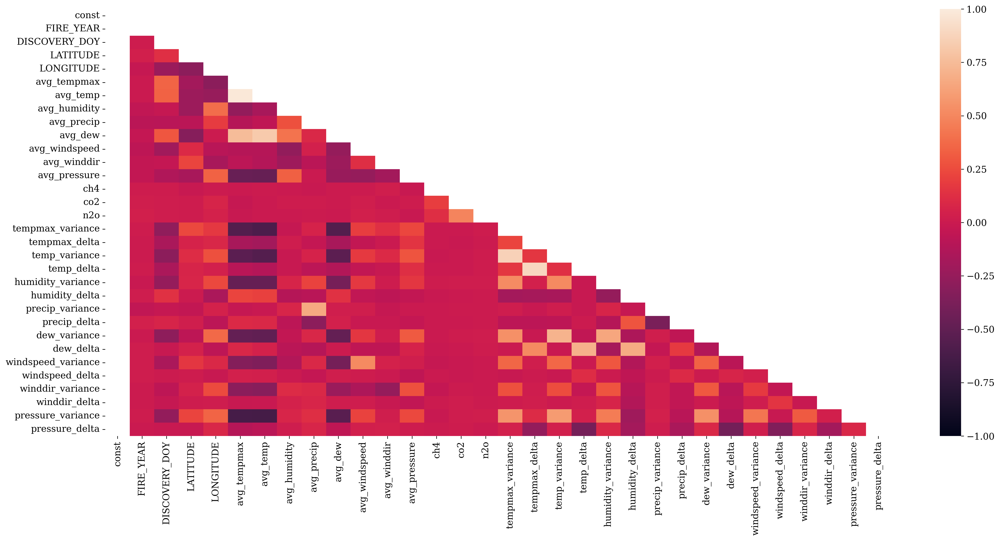

In [221]:
utils.PlotCorrelationMatrix(X_1, annot=False)

Even though we have removed the state variables from our predictor variables, there are still a number of variables with extreme VIF scores, such as `avg_temp` and `avg_dew`. This seems to match up with the visual inspection of the correlations in our heatmap.

Other variables with high VIF scores are: `tempmax_variance`, `temp_variance`, `tempmax_delta`, `humidity_delta`, `temp_delta`, `avg_humidity`, `dew_delta`, and `avg_tempmax`.

Based on this evaluation it would perhaps make most sense to remove `avg_temp`, considering the extremely high VIF of this factor.

In [224]:
tmp = X_1.drop('avg_temp', axis=1)

linreg_utils.create_vif_df(tmp)

,VIF
FIRE_YEAR,1.033798
ch4,1.045816
winddir_delta,1.096128
windspeed_delta,1.257138
avg_winddir,1.293392
n2o,1.316305
DISCOVERY_DOY,1.333298
precip_delta,1.342923
co2,1.353125
winddir_variance,1.427066


We see that by removing the `avg_temp` variable, we have been able to significantly reduce the VIF values of the other features. Let us see how the values will be affected if we remove `dew_delta`.

In [225]:
tmp = tmp.drop('dew_delta', axis=1)

linreg_utils.create_vif_df(tmp)

,VIF
FIRE_YEAR,1.033769
ch4,1.045519
winddir_delta,1.096040
windspeed_delta,1.237780
avg_winddir,1.293346
n2o,1.316205
precip_delta,1.319252
DISCOVERY_DOY,1.333191
co2,1.353125
humidity_delta,1.404889


We see that multicollinearity persists - to reduce multicollinearity we will iteratively remove values from our data set.

In [226]:
tmp = tmp.drop('avg_dew', axis=1)

linreg_utils.create_vif_df(tmp)

,VIF
FIRE_YEAR,1.033742
ch4,1.044003
winddir_delta,1.096009
windspeed_delta,1.237055
avg_winddir,1.272661
n2o,1.315869
precip_delta,1.318929
DISCOVERY_DOY,1.331577
co2,1.345505
humidity_delta,1.404559


In [227]:
tmp = tmp.drop('temp_delta', axis=1)

linreg_utils.create_vif_df(tmp)

,VIF
FIRE_YEAR,1.033741
ch4,1.043927
winddir_delta,1.091982
windspeed_delta,1.199767
avg_winddir,1.270300
n2o,1.315799
precip_delta,1.318909
DISCOVERY_DOY,1.321458
tempmax_delta,1.323623
humidity_delta,1.325996


In [228]:
tmp = tmp.drop('temp_variance', axis=1)

linreg_utils.create_vif_df(tmp)

,VIF
FIRE_YEAR,1.033728
ch4,1.043631
winddir_delta,1.091514
windspeed_delta,1.199402
avg_winddir,1.269891
n2o,1.315762
precip_delta,1.318808
DISCOVERY_DOY,1.320975
tempmax_delta,1.323621
humidity_delta,1.324953


Having iteratively removed variables, we have been able to ensure that all the variables have a VIF of less than 5. We can now build our first model.

In [165]:
from sklearn.model_selection import train_test_split

X_removed = tmp

sm_base_linreg = linear_model.OLS(y, X_removed).fit()

sm_base_linreg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              FIRE_SIZE   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     3.233
Date:                Mon, 21 Nov 2022   Prob (F-statistic):           8.81e-08
Time:                        22:05:54   Log-Likelihood:            -1.9719e+05
No. Observations:               20851   AIC:                         3.944e+05
Df Residuals:                   20825   BIC:                         3.946e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               4642.2409   9392.374      0.494      0.621   -1.38e+04    2.31e+04
FIRE_YEAR              0.2654      3.094      0.086      0.932      -5.800       6.331
DISCOVERY_DOY         -0.5317      0.269     -1.977      0.048      -1.059      -0.005
LATITUDE              26.4924      4.589      5.773      0.000      17.498      35.487
LONGITUDE             -5.5416      1.642     -3.374      0.001      -8.761      -2.323
avg_tempmax            4.9796      4.331      1.150      0.250      -3.510      13.469
avg_humidity           2.7118      2.050      1.323      0.186      -1.307       6.730
avg_precip           -11.0478     13.479     -0.820      0.412     -37.467      15.371
avg_windspeed         -0.4027      5.226     -0.077      0.939     -10.646       9.841
avg_winddir           -1.4251      0.422     -3.379      0.001      -2.252      -0.598
avg_pressure          -6.3857      6.358     -1.004      0.315     -18.848       6.077
ch4                -7.497e+09   3.95e+10     -0.190      0.850   -8.49e+10       7e+10
co2                -8.242e+06      1e+08     -0.082      0.934   -2.05e+08    1.88e+08
n2o                 -5.03e+11   1.76e+12     -0.286      0.775   -3.95e+12    2.95e+12
tempmax_variance     -15.7178     17.629     -0.892      0.373     -50.271      18.836
tempmax_delta         -2.2772      3.810     -0.598      0.550      -9.745       5.190
humidity_variance     10.6623     12.597      0.846      0.397     -14.029      35.354
humidity_delta         0.2052      1.493      0.137      0.891      -2.721       3.132
precip_variance        0.0621      0.173      0.360      0.719      -0.276       0.400
precip_delta          -1.2498      3.160     -0.395      0.693      -7.445       4.945
dew_variance          23.9813     17.746      1.351      0.177     -10.802      58.764
windspeed_variance   -14.5541     18.010     -0.808      0.419     -49.856      20.747
windspeed_delta       -0.8781      2.437     -0.360      0.719      -5.655       3.899
winddir_variance      -0.5137      0.461     -1.115      0.265      -1.416       0.389
winddir_delta         -0.0877      0.172     -0.511      0.609      -0.424       0.249
pressure_variance     15.2053     19.428      0.783      0.434     -22.874      53.285
pressure_delta        -3.2094      3.445     -0.932      0.352      -9.962       3.543
==============================================================================
Omnibus:                    87914.956   Durbin-Watson:                   2.001
Prob(Omnibus):                  0.000   Jarque-Bera (JB):     224189384462.366
Skew:                         120.902   Prob(JB):                         0.00
Kurtosis:                   16065.032   Cond. No.                     1.86e+14
==============================================================================

In [167]:
print(f'This score for this model is: {sm_base_linreg.rsquared:.4f}')

This score for this model is: 0.0039


We are also able to create a model using scikit learn, which uses a simpler implementation. We can also see how this performs on a test set.

In [169]:
from sklearn.linear_model import LinearRegression

# Get the columns that we kept, removing the constant value with indexing
cols = X_removed.columns.values[1:]

X = df_processed[cols]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

sk_base_linreg = LinearRegression()
sk_base_linreg.fit(X_train, y_train)

print(f'The train score for the base model is: {sk_base_linreg.score(X_train, y_train):.4f}')
print(f'The test score for the base model is: {sk_base_linreg.score(X_test, y_test):.4f}')

The train score for the base model is: 0.0049
The test score for the base model is: -0.2589


One of the problems that we have at the moment is that our variables are not currently scaled. This means that certain features are having a disproportionate affect on our linear regression. To combat this we would need to scale our variables. Columns which are heavily skewed, such as the precipitation variance and the emissions features, will be scaled using a Robust Scaler. Normally distributed features, on the other hand, will be scaled with a Standard Scaler, while those features that are relatively evenly distributed will be scaled with a MinMax Scaler.

In [170]:
# See which features remain
X_removed.columns.values

array(['const', 'FIRE_YEAR', 'DISCOVERY_DOY', 'LATITUDE', 'LONGITUDE',
       'avg_tempmax', 'avg_humidity', 'avg_precip', 'avg_windspeed',
       'avg_winddir', 'avg_pressure', 'ch4', 'co2', 'n2o',
       'tempmax_variance', 'tempmax_delta', 'humidity_variance',
       'humidity_delta', 'precip_variance', 'precip_delta',
       'dew_variance', 'windspeed_variance', 'windspeed_delta',
       'winddir_variance', 'winddir_delta', 'pressure_variance',
       'pressure_delta'], dtype=object)

In [171]:
# Create the scaling columns
robust_cols = ['precip_variance', 'ch4', 'n2o', 'co2']
minmax_cols = ['FIRE_YEAR', 'DISCOVERY_DOY', 'LATITUDE', 'LONGITUDE']
ss_cols = [col for col in X_train.columns
           if col not in robust_cols
           if col not in minmax_cols]

Now that we have created these lists, we can create a column transformer that converts these columns using the appropriate scaler.

In [172]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer

# Create column transformation list
col_transforms = [('standard scale', StandardScaler(), ss_cols),
                  ('minmax scale', MinMaxScaler(), minmax_cols), 
                  ('robust scale', RobustScaler(), robust_cols)]

# Create the column transformer
col_transformer = ColumnTransformer(col_transforms, remainder='passthrough')

# Fit to X_train
col_transformer.fit(X_removed);

In [173]:
X_transformed = col_transformer.transform(X_removed)

sm_linreg = linear_model.OLS(y, X_transformed).fit()

print(sm_linreg.summary())

                            OLS Regression Results                            
Dep. Variable:              FIRE_SIZE   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     3.109
Date:                Mon, 21 Nov 2022   Prob (F-statistic):           1.63e-07
Time:                        22:06:46   Log-Likelihood:            -1.9719e+05
No. Observations:               20851   AIC:                         3.944e+05
Df Residuals:                   20824   BIC:                         3.946e+05
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            41.5443     36.031      1.153      0.2

Unfortunately, we see that even scaling was unable to improve our model. Let us see how this performs against a test set.

In [174]:
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer

# Create column transformation list
col_transforms = [('standard scale', StandardScaler(), ss_cols),
                  ('minmax scale', MinMaxScaler(), minmax_cols), 
                  ('robust scale', RobustScaler(), robust_cols)]

# Create the column transformer
col_transformer = ColumnTransformer(col_transforms, remainder='passthrough')

# Fit to X_train
col_transformer.fit(X_train);

In [175]:
# Transform the train and test set
X_train_transformed = col_transformer.transform(X_train)
X_test_transformed = col_transformer.transform(X_test)

In [176]:
# Create the Linear Regression with the transformed columns
sk_linreg = LinearRegression()
sk_linreg.fit(X_train_transformed, y_train);

In [177]:
print(f'The train score for the base model is: {linreg.score(X_train_transformed, y_train):.4f}')
print(f'The test score for the base model is: {linreg.score(X_test_transformed, y_test):.4f}')

The train score for the base model is: 0.0049
The test score for the base model is: -0.2589


Unfortunately, scaling the columns did not improve the $R^2$ value of our model. In fact, it didn't change the outcome of our model at all. While we could continue our feature selection process and remove variables that have a high p-value we realise that the complexity of this task is perhaps too much for this model. We will see how the model performed in the following section.

<a id='evaluation'></a>
### Baseline Model Evaluation

The model continues to perform as poorly as before we carried out any scaling, generating a negative $R^2$ value. Before we look at the coefficients to see how these influenced the predictions of the model, we can see how the model performed with regards to the assumptions of a linear regression model.

#### Homoscedasticity
Homoscedasticity is the assumption of **equal variances**, meaning that the error term (that is, the “noise” or random disturbance in the relationship between the predictor variables and the target variable) is the same across all values of the predictor variables. 

The homoscedasticity of our model can be evaluated both graphically and through statistical tests. To do this, we will use the statsmodel linear regression we have created.

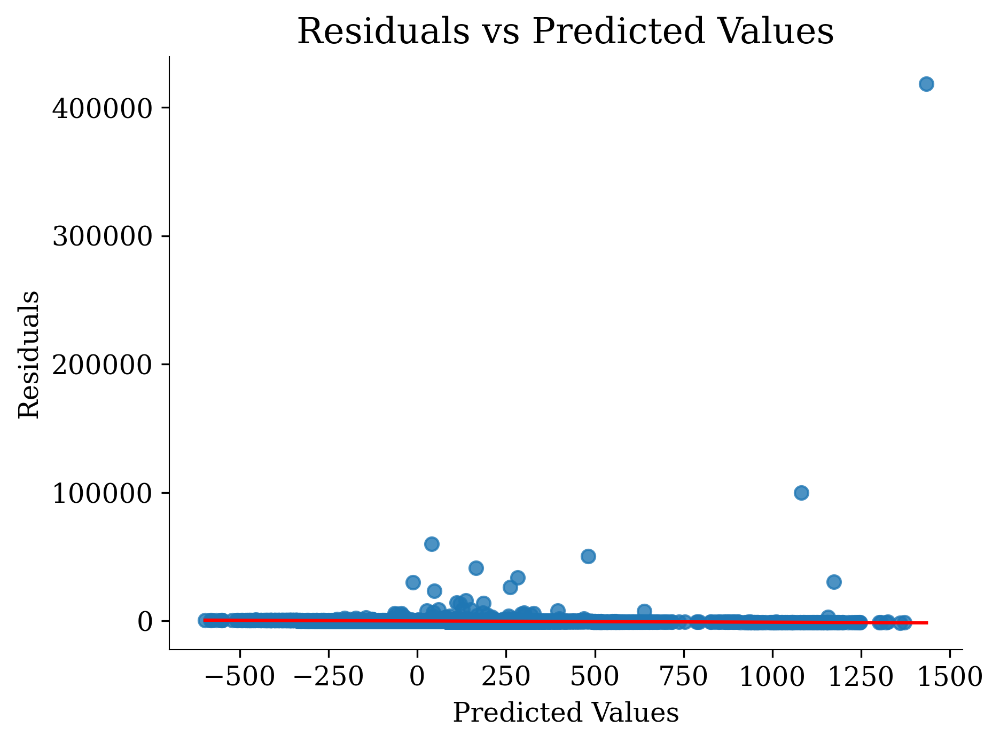

In [186]:
predictions = sm_linreg.predict()
residuals = sm_linreg.resid

plt.figure()
sns.regplot(
    x=predictions, 
    y=residuals, 
    lowess=True, 
    line_kws={'color': 'red'}
)
plt.title('Residuals vs Predicted Values', fontsize=16)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

From the graph we are unable to decipher much, however we do see that the model predicts implausible fire sizes (negative values). The errors from the residuals are so high that even in this instance we are unable to decipher these.

We can also use the Breusch-Pagan Test as follows:

In [188]:
import statsmodels.stats.api as sms
bp_test = pd.DataFrame(sms.het_breuschpagan(residuals, sm_linreg.model.exog), 
                       columns=['value'],
                       index=['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value'])
bp_test

,value
Lagrange multiplier statistic,60.435602
p-value,0.000147
f-value,2.328184
f p-value,0.000145


The results indicate that the assumption of homoscedasticity is not satisfied and should be rejected.

We can check a further assumption, namely normality.

#### Normality

In linear regression models we assume that the residuals are normally distributed. Again here we can use a number of methods to determine whether this is the case or not.

First, we can use a histogram that plots the distribution of our residuals.

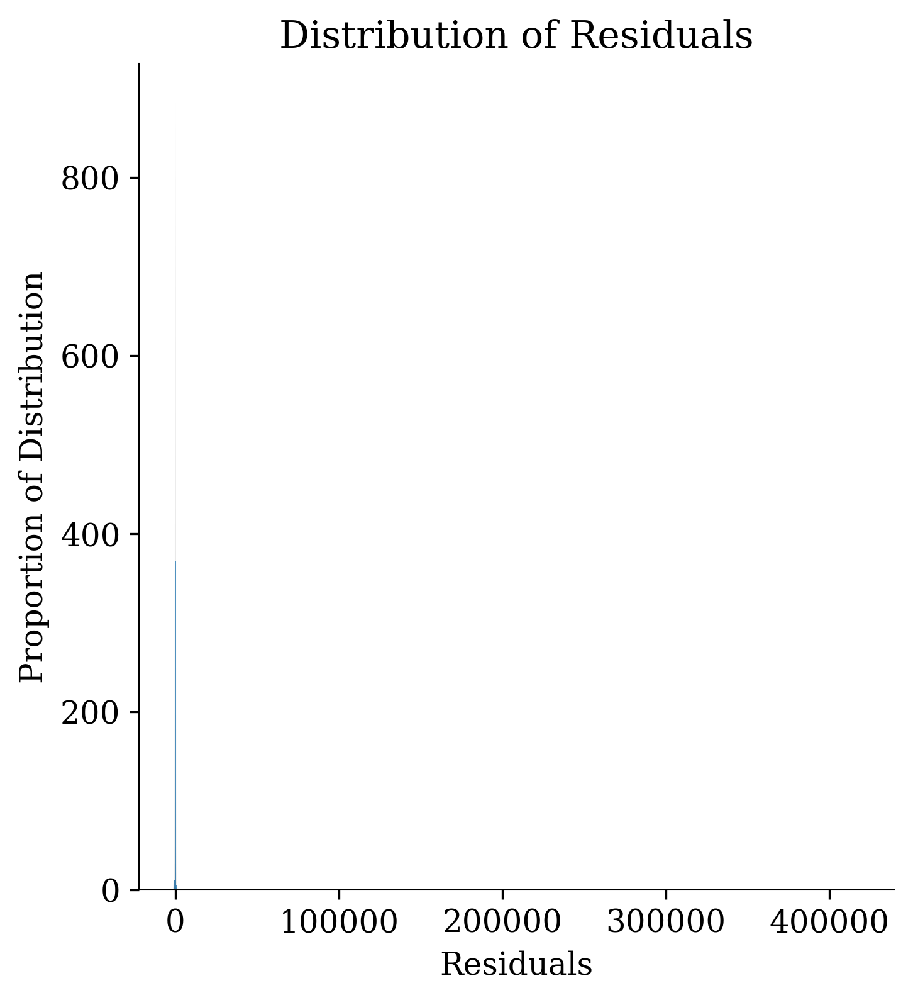

In [189]:
# Histogram
sns.displot(sm_linreg.resid)
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Proportion of Distribution')
plt.show()

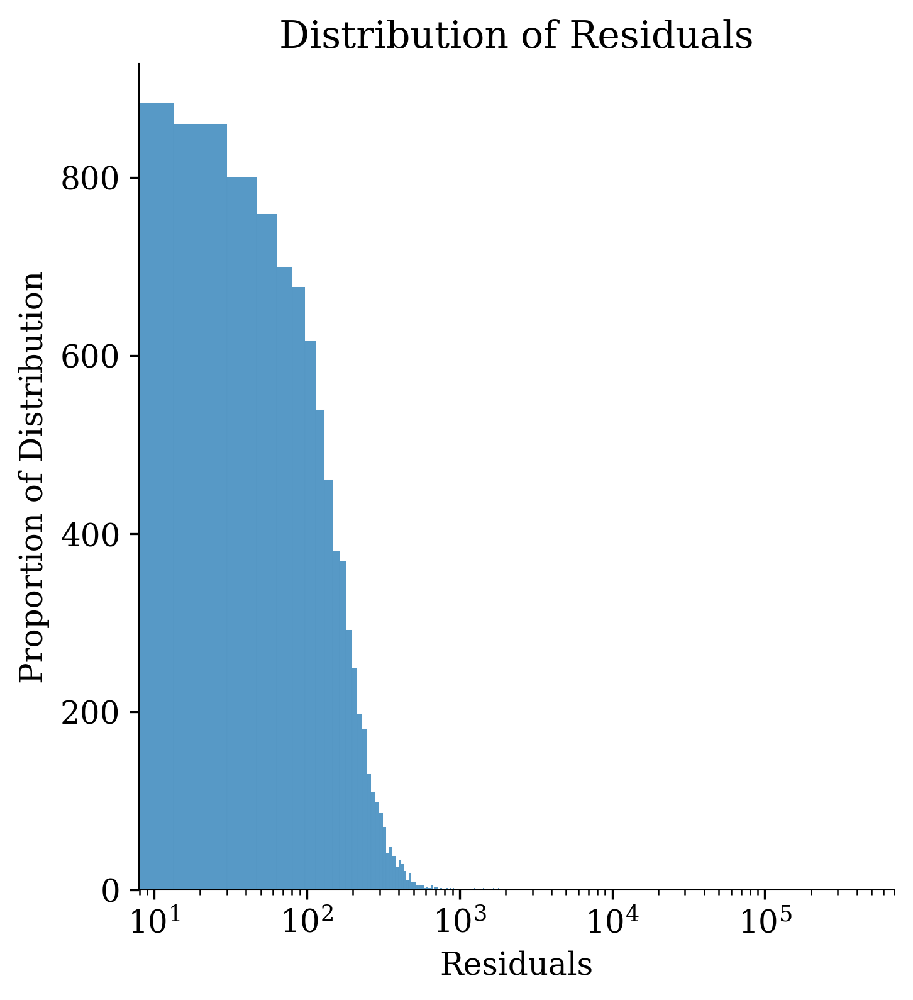

In [230]:
# Histogram
sns.displot(sm_linreg.resid)
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Proportion of Distribution')
plt.xscale('log')
plt.show()

We see just how poorly our model performed and how extremely skewed our residuals are. This is not surprising considering the scores achieved by our model.

Alternatively we can use a QQ plot. A QQ plot is a graph that shows how two data sets compare to each other. The plot is a scatter plot with the data points from one data set on the x-axis and the data points from the other data set on the y-axis. The plot also has a line that represents where the two data sets would be if they were identical.

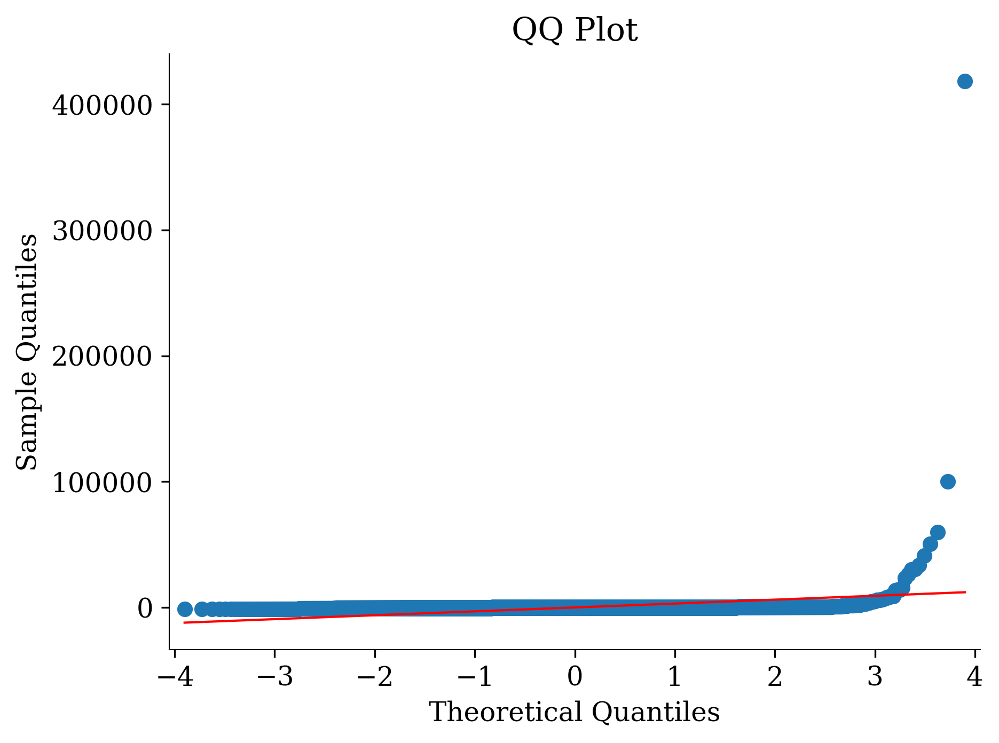

In [190]:
# QQ plot
sm.ProbPlot(sm_linreg.resid).qqplot(line='s');
plt.title('QQ Plot')
plt.show()

The final method that we can use is the Shapiro-Wilk test, in which we test a null hypothesis that claims the data is normally distributed. The alternate hypothesis, therefore, is that the model is not normally distributed.

In [191]:
stats.shapiro(sm_linreg.resid)

/Users/ejb/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/scipy/stats/morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.015289902687072754, pvalue=0.0)

Again, here we see even further evidence that the residuals are not normally distributed given the p-value and the statistic score.

Let us take a look at the regression coefficients and see how these influenced the model itself.

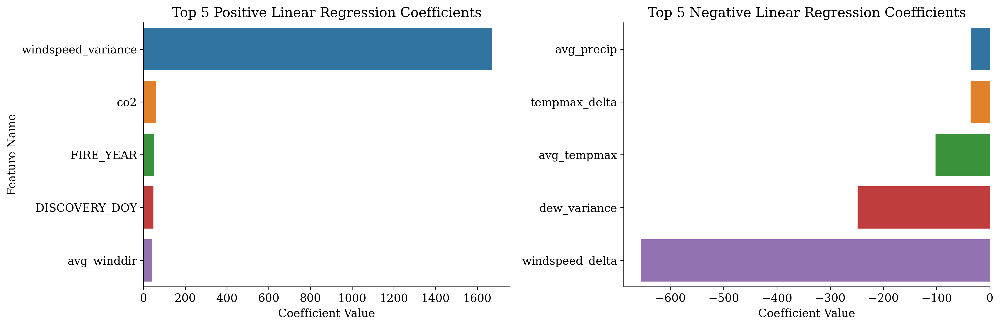

In [178]:
# The coefficient, notice it returns an array with one spot for each feature
coefficients = sk_linreg.coef_

coefficients_df = pd.DataFrame(data={'coef':coefficients}, index=X.columns).sort_values(by='coef', ascending=False)

plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.title('Top 5 Positive Linear Regression Coefficients')
sns.barplot(x='coef', y=coefficients_df.head().index, data=coefficients_df.head())
plt.xlabel('Coefficient Value')
plt.ylabel('Feature Name')

plt.subplot(1, 2, 2)
plt.title('Top 5 Negative Linear Regression Coefficients')
sns.barplot(x='coef', y=coefficients_df.tail().index, data=coefficients_df.tail())
plt.xlabel('Coefficient Value')
plt.show()

From the graphs of the coefficients we see that the fire size is largely determined windspeed variance, even though it is the change in windspeed that has the lowest coefficient value, along with dew variance and average max temperature. We see though, from the scale of the coefficient values, that these variables are not good predictors of wildfire size and we can see from other metrics, such as Mean Absolute Error (MAE) and Root Mean Squared Errror (RMSE), that the model performed poorly.

In [180]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

y_pred = sk_linreg.predict(X_test_transformed)

print(f'MAE: {mean_absolute_error(y_test, y_pred)}')
print(f'RMSE: {mean_squared_error(y_test, y_pred)}')

MAE: 202.1690464310703
RMSE: 311049.52860822453


<a id='improvement'></a>
### Model Improvement

Another way in which we are able to determine the most important features is by using regularization methods. Typically, regularisation is used to prevent a model from overfitting to a training set and improve overall performance. Regularisation methods therefore aim to regularise coefficient values by either reducing them (Ridge) or making them equal to 0 (Lasso). By increasing the penalty of the regularisation methods then we are able to determine the most important features of a model.

In [137]:
from sklearn.linear_model import Lasso, Ridge
from sklearn.model_selection import cross_val_score

alphas = np.linspace(1, 50, 50)

cross_val_scores = []

for alpha in alphas:
    print(f'Creating model {alpha}', end=' \r')
    lasso = Lasso(alpha=alpha)
    cv_score = np.mean(cross_val_score(lasso, X_train_transformed, y_train, cv = 5))
    cross_val_scores.append(cv_score)

Using a higher alpha increases the penalty, which means features are removed if they are not contributing sufficiently to the model. 

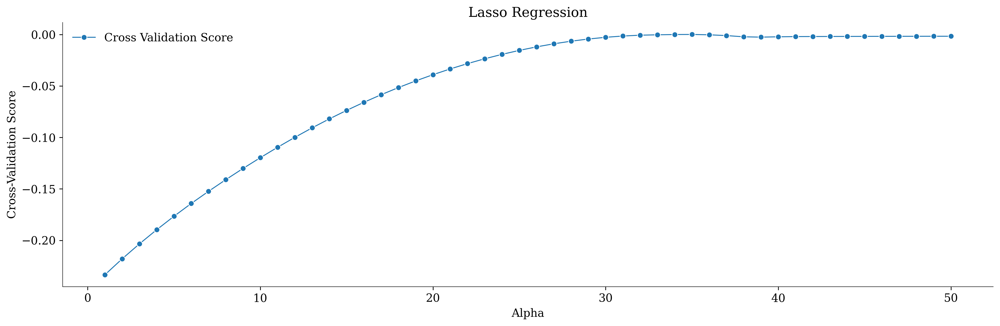

In [138]:
plt.figure(figsize=(15, 5))
plt.title('Lasso Regression')
sns.lineplot(x=alphas, y=cross_val_scores, marker='o', label='Cross Validation Score')
plt.xlabel('Alpha')
plt.ylabel('Cross-Validation Score')
plt.show()

We see then, as the alpha increases, that the models' $R^2$ values increase as redundant columns are removed. With very high alpha values, we see that the model tends towards a cross validation score of 0. We can see the alpha value that generated the highest cross validation score and see the features that determined this.

In [139]:
print(f'The alpha that generated the highest validation score was: {alphas[np.argmax(cross_val_scores)]}')
print(f'This generated a score of: {max(cross_val_scores):.4f}')

The alpha that generated the highest validation score was: 35.0
This generated a score of: 0.0001


In [140]:
import linreg_utils

lasso_df = linreg_utils.ridge_lasso_evaluation(Lasso, X_train, y_train, alphas)
plt.figure(figsize=(30, 30))
sns.heatmap(lasso_df)
plt.show()

As in the previous model, we see that the only values that contributed to the model were geographic. Even in this instance this isn't an insightful realisation, neither is it specific - Alaska has a high proportion of large wildfires, meaning that if a wildfire is located in Alaska, there is a higher probability that it is going to be larger. 

We also mentioned previously that there is another method of regularisation - Ridge Regression. Unlike the Lasso Regression this is going to reduce the coefficients of features rather than setting them to 0. We can therefore gain a better understanding of the way in which features interact. 

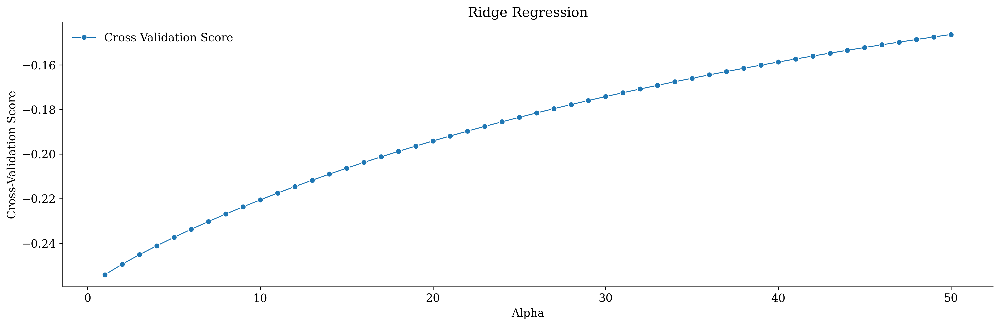

In [141]:
cross_val_scores = []

for alpha in alphas:
    ridge = Ridge(alpha=alpha)
    cv_score = np.mean(cross_val_score(ridge, X_train, y_train, cv = 5))
    cross_val_scores.append(cv_score)
    
plt.figure(figsize=(15, 5), dpi=300)
plt.title('Ridge Regression')
sns.lineplot(x=alphas, y=cross_val_scores, marker='o', label='Cross Validation Score')
plt.xlabel('Alpha')
plt.ylabel('Cross-Validation Score')
plt.show()

We see that in this case, because the features are never fully removed, we have generally less accurate models.

In [142]:
ridge_df = linreg_utils.ridge_lasso_evaluation(Ridge, X_train, y_train, alphas)

plt.figure(figsize=(30, 30))
sns.heatmap(ridge_df)
plt.show()

Once again, we see that the state in which the fire is located is going to heavily influence the accuracy of the model. Other features seemingly have no affect on the outcome of the models.

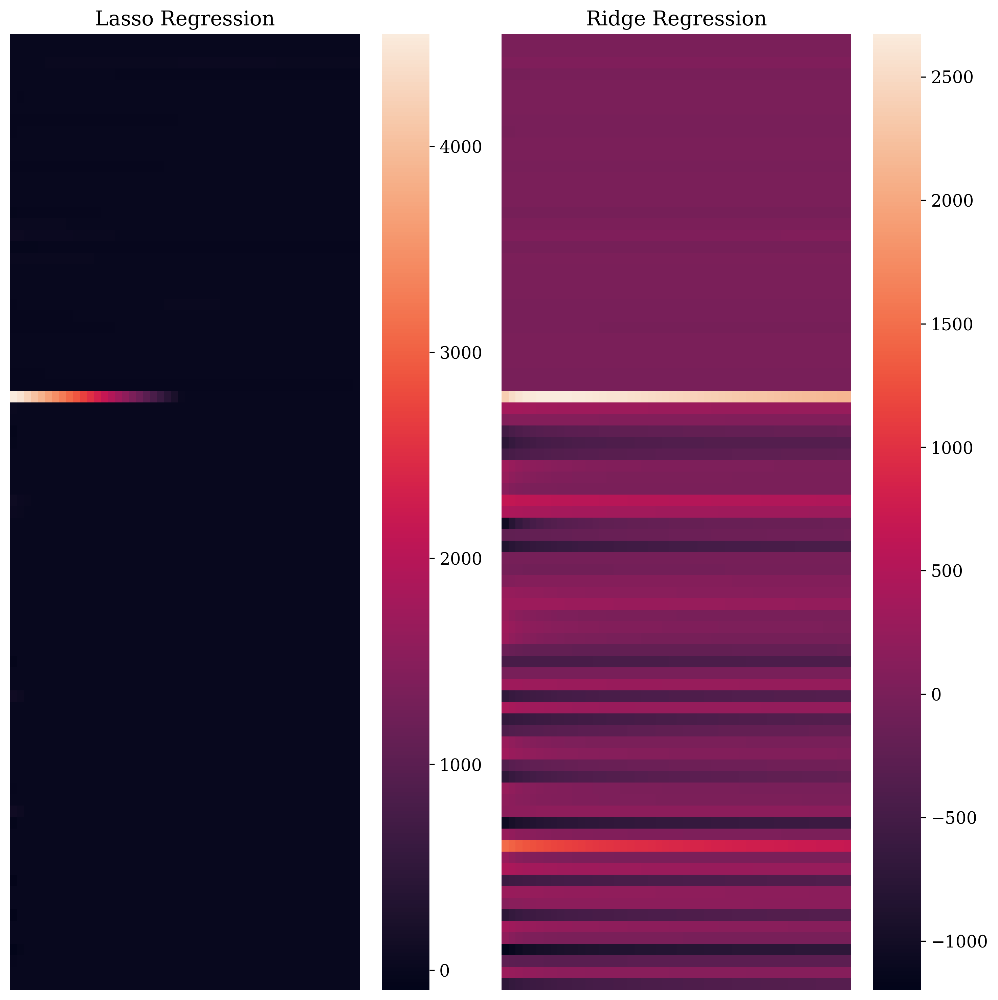

In [143]:
# Comparison of the models
plt.subplots(1, 2, figsize=(10, 10))

plt.subplot(1, 2, 1)
plt.title('Lasso Regression')
sns.heatmap(lasso_df)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Ridge Regression')
sns.heatmap(ridge_df)
plt.axis('off')
plt.show()

---
<a id='base_logreg'></a>
## Baseline Logistic Regression

Having been unsuccessful in creating a Linear Regression model, we can perhaps build a logistic regression model that classifies a fire size into one of the 7 classes. The accuracy for this model, invariably, will be much larger considering the distributions of the classes. 

In [144]:
X = df_processed.drop(['FIRE_SIZE', 'FIRE_SIZE_CLASS'], axis=1)
y = df_processed['FIRE_SIZE_CLASS']

utils.count_percentage_df(y)

,Count,Percentage of Total
B,10529,0.504964
A,7355,0.352741
C,2441,0.117069
D,299,0.014340
E,140,0.006714
F,56,0.002686
G,31,0.001487


As we can see, over 50% of the fires fall within fire class B, meaning that a dummy model that always predicts a fire to belong to class B, will be correct 50% of the time. 

With this in mind, let us begin building the model.

In [145]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=1)

In [146]:
X_train_transformed = col_transformer.transform(X_train)
X_test_transformed = col_transformer.transform(X_test)

In [147]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(max_iter=10000)
logreg.fit(X_train_transformed, y_train)

LogisticRegression(max_iter=10000)

In [148]:
logreg.score(X_test_transformed, y_test)

0.5914648765284104

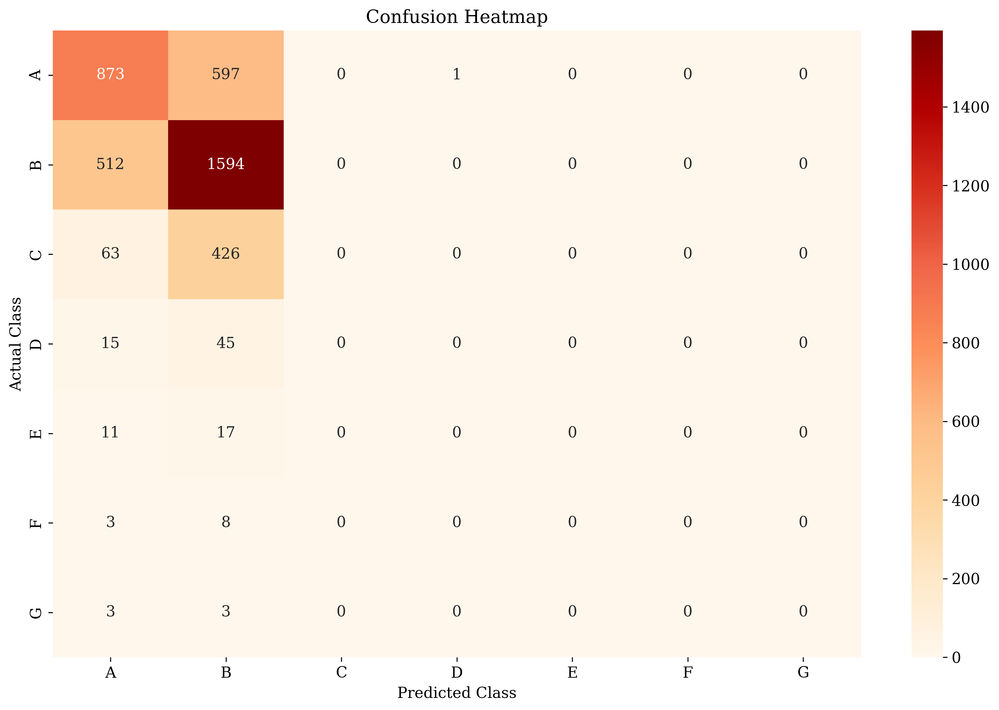

In [151]:
from sklearn.metrics import confusion_matrix

# Make classifications based on the test features, and assign the classifications to a variable
y_pred = logreg.predict(X_test_transformed)

predictions = y_test.unique()
predictions.sort()

# Build the confusion matrix as a dataframe
confusion_df = pd.DataFrame(confusion_matrix(y_test, y_pred))
confusion_df.index = [i for i in predictions]
confusion_df.columns = [i for i in predictions]

# Heatmap of the above
plt.figure(figsize=(12, 8), dpi=300)
sns.heatmap(confusion_df, annot=True, fmt='d', cmap='OrRd') # Passing in fmt='d' prevents the counts from being displayed in scientific notation
plt.title('Confusion Heatmap')
plt.xlabel('Predicted Class')
plt.ylabel('Actual Class')
plt.show()

Although accuracy provides a good overview of the model, we can analyse the performance better by looking at the classification report, which shows the f1 values for each variable and the model as a whole.

In [153]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           A       0.59      0.59      0.59      1471
           B       0.59      0.76      0.66      2106
           C       0.00      0.00      0.00       489
           D       0.00      0.00      0.00        60
           E       0.00      0.00      0.00        28
           F       0.00      0.00      0.00        11
           G       0.00      0.00      0.00         6

    accuracy                           0.59      4171
   macro avg       0.17      0.19      0.18      4171
weighted avg       0.51      0.59      0.54      4171



/Users/ejb/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ejb/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/ejb/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


From the classification report, we see that the model was very poor at classifying fires not within the first 2 classes. Given the imbalance in the data, it is unsurprising that this is the case. When working with imbalanced data sets, machine learning techniques will ignore, and consequently perform poorly on, the minority classes even though in our case it would be beneficial to know exactly what features cause larger fires than others. It has become clear then that perhaps in order to improve both of the models created we will need to increase the size of the data that we have collected in an attempt to balance the data that we have and reduce the imbalance that is negatively affecting our models. The succeeding notebook will therefore collect data exclusively from larger wildfires (classes D to G) and append these observations to the ones that we have already collected.